In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
datadir = "/v/Data/cyto/mmCompensatedTifs/"
#datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/v/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/v/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/v/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/v/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/v/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/v/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/v/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/v/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/v/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/v/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/v/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/v/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/v/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/v/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/v/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/v/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/v/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/v/Data/cyto/mmCompensatedTifs/Fish5_ICE.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64 

dict_keys(['Fish4_Untreated.mm', 'Fish3_CCB.mm', 'Fish4_CCB.mm', 'Fish1_Untreated.mm', 'Fish2_ICE.mm', 'Fish2_CCB.mm', 'Fish5_CCB.mm', 'Fish1_Ice.mm', 'Fish6_CCB.mm', 'Fish3_Untreated.mm', 'Fish4_ICE.mm', 'Fish6_ICE.mm', 'Fish3_ICE.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish5_Untreated.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
Tensor("Placeholder:0", shape=(?, 32, 32, 3), dtype=float32) (?, 32, 32, 3)
isize:  4 32
dh0 (?, 32, 32, 3)
180000 1406 128
Epoch:  0 Iteration:  0 Loss:  746.6654 554.45703 192.20836


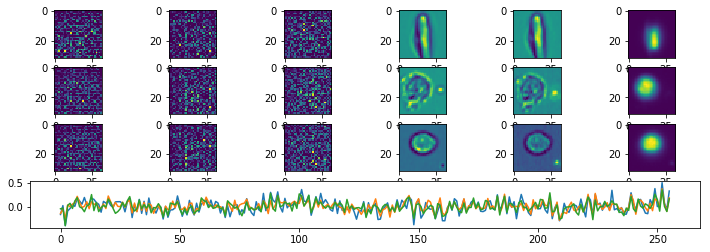

Epoch:  0 Iteration:  500 Loss:  13.438243 11.333952 2.1042912


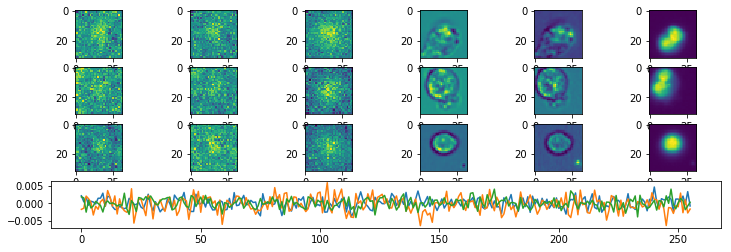

Epoch:  0 Iteration:  1000 Loss:  11.11153 10.146088 0.9654425


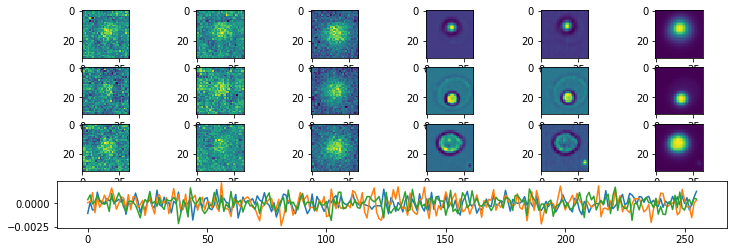

Epoch:  1 Iteration:  0 Loss:  10.500032 9.612122 0.88791126


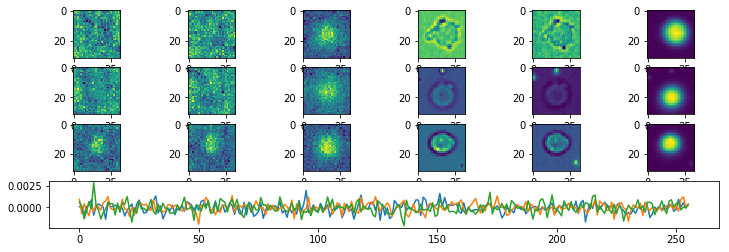

Epoch:  1 Iteration:  500 Loss:  10.138945 9.300133 0.8388117


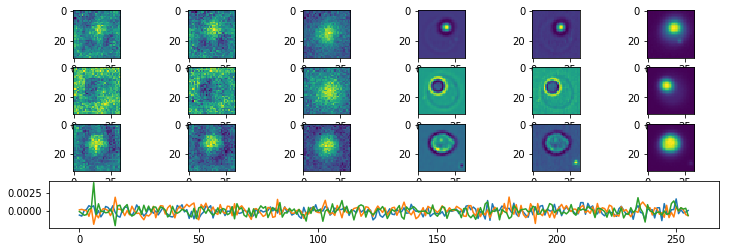

Epoch:  1 Iteration:  1000 Loss:  9.318654 8.493582 0.82507247


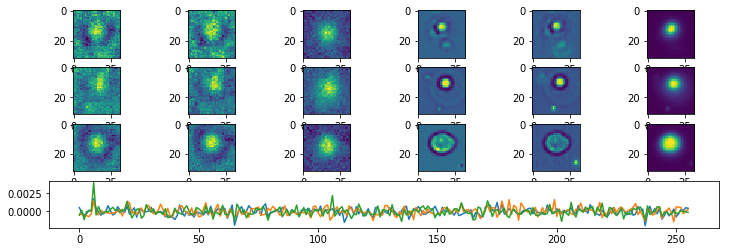

Epoch:  2 Iteration:  0 Loss:  8.798777 7.9417334 0.8570429


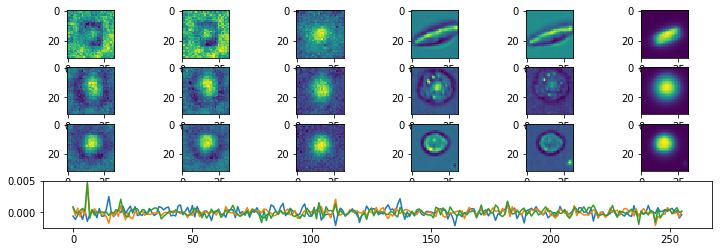

Epoch:  2 Iteration:  500 Loss:  8.286685 7.4022694 0.88441604


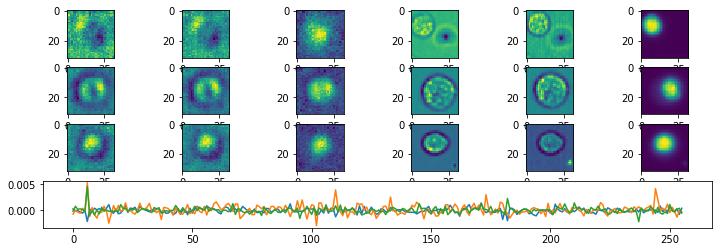

Epoch:  2 Iteration:  1000 Loss:  8.784551 7.318901 1.4656495


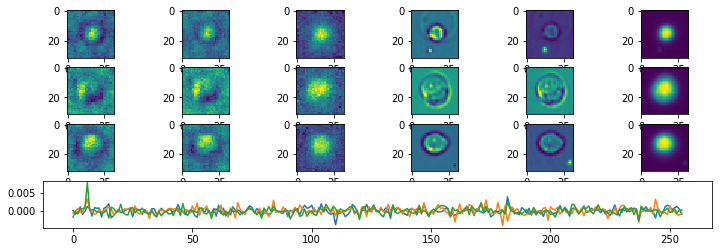

Epoch:  3 Iteration:  0 Loss:  7.915432 6.744523 1.170909


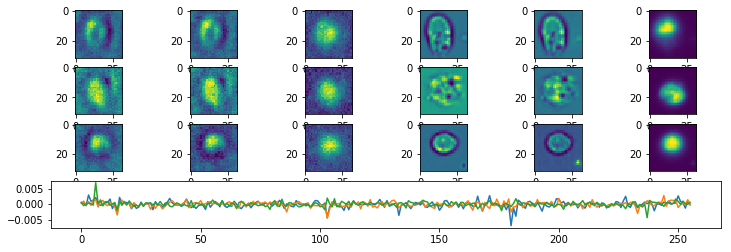

Epoch:  3 Iteration:  500 Loss:  7.7994742 6.810826 0.98864853


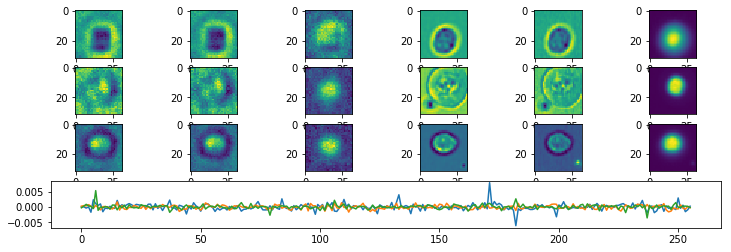

Epoch:  3 Iteration:  1000 Loss:  7.378218 6.503887 0.87433094


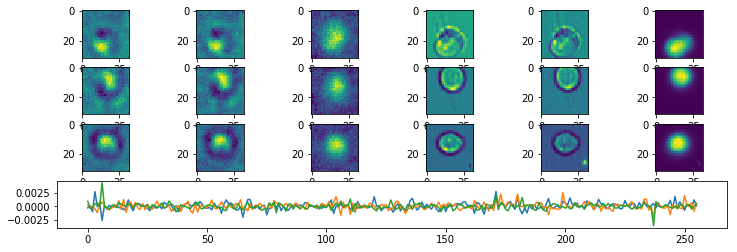

Epoch:  4 Iteration:  0 Loss:  7.013058 6.169721 0.8433369


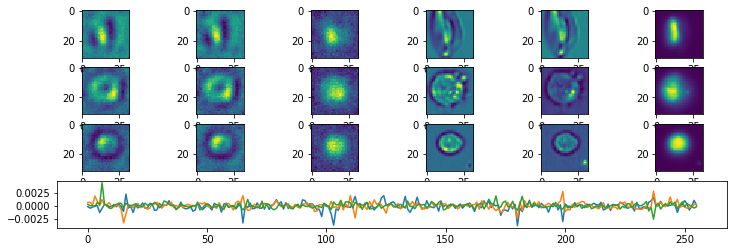

Epoch:  4 Iteration:  500 Loss:  7.02255 6.1725163 0.85003394


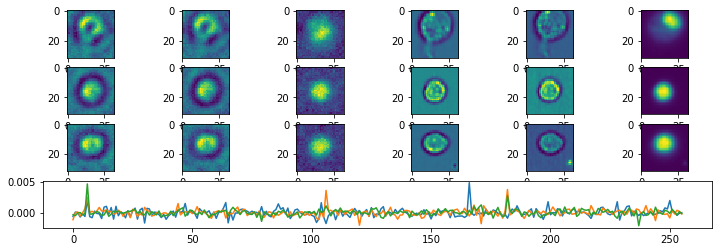

Epoch:  4 Iteration:  1000 Loss:  6.7580595 5.9279757 0.83008367


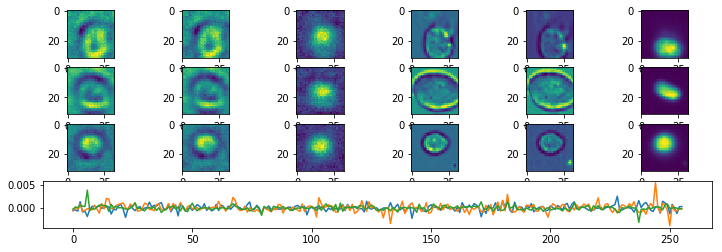

Epoch:  5 Iteration:  0 Loss:  6.2636604 5.4341164 0.8295439


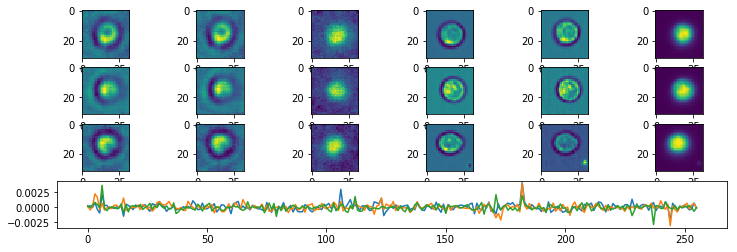

Epoch:  5 Iteration:  500 Loss:  6.1067615 5.2331514 0.87360996


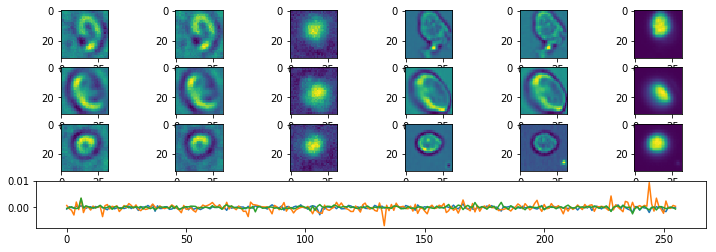

Epoch:  5 Iteration:  1000 Loss:  5.5056734 4.6725526 0.833121


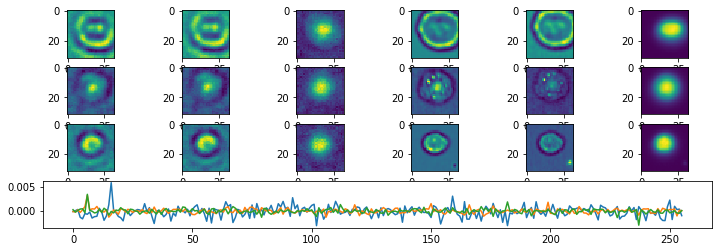

Epoch:  6 Iteration:  0 Loss:  5.190904 4.3693485 0.82155555


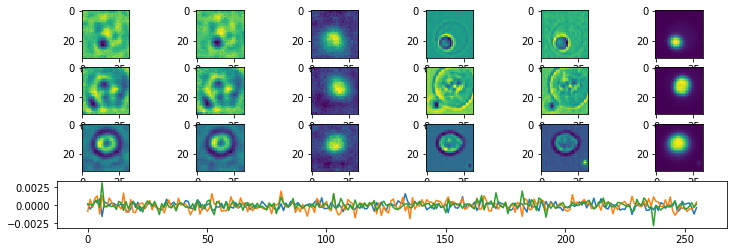

Epoch:  6 Iteration:  500 Loss:  8.352448 5.8632145 2.4892342


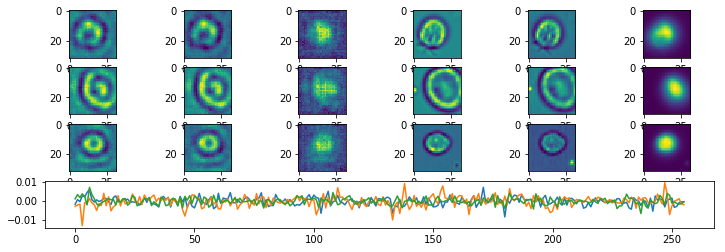

Epoch:  6 Iteration:  1000 Loss:  5.845298 4.538429 1.3068689


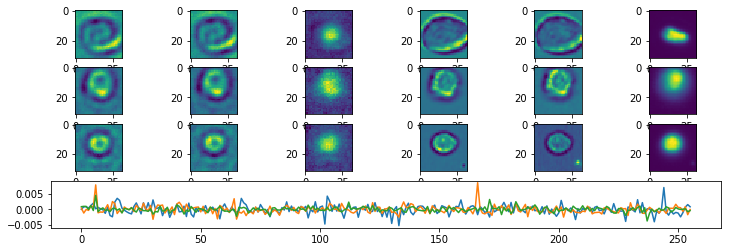

Epoch:  7 Iteration:  0 Loss:  5.249077 4.173248 1.0758288


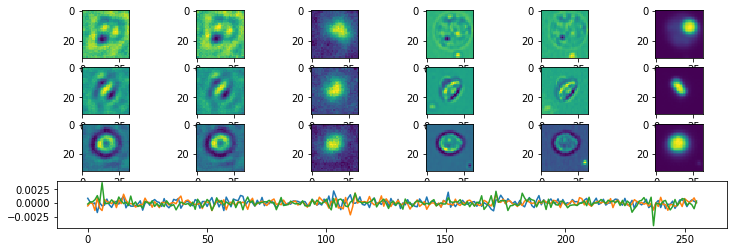

Epoch:  7 Iteration:  500 Loss:  5.168622 4.2000422 0.96857995


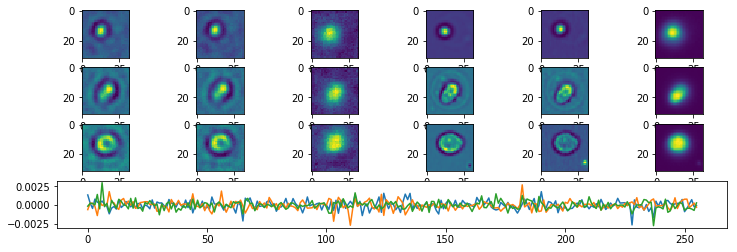

Epoch:  7 Iteration:  1000 Loss:  4.982698 4.1014113 0.88128644


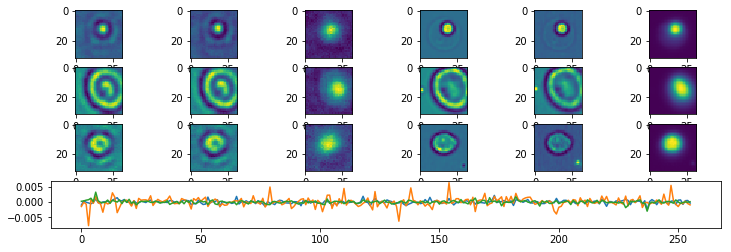

Epoch:  8 Iteration:  0 Loss:  4.7877874 3.9536037 0.8341835


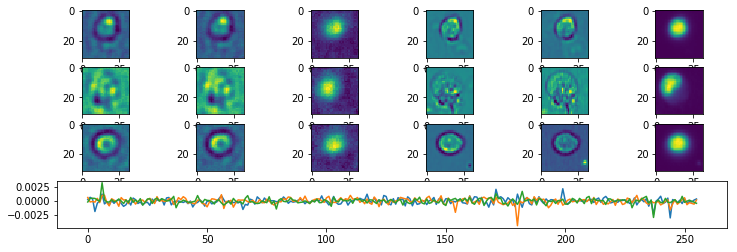

Epoch:  8 Iteration:  500 Loss:  4.848338 4.009255 0.8390832


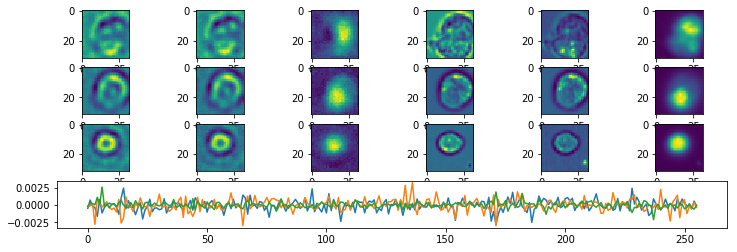

Epoch:  8 Iteration:  1000 Loss:  4.5949984 3.8228192 0.7721793


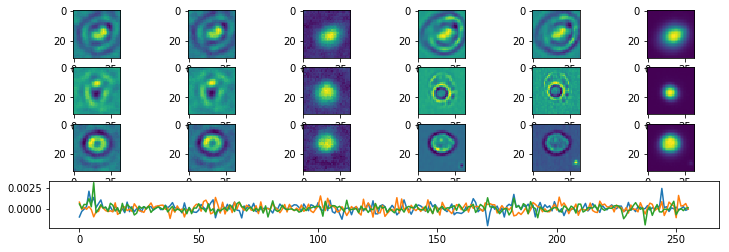

Epoch:  9 Iteration:  0 Loss:  4.5010586 3.737382 0.76367664


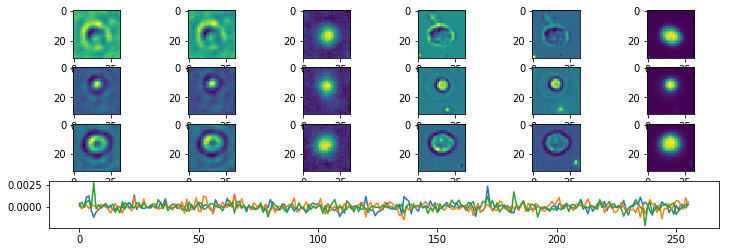

Epoch:  9 Iteration:  500 Loss:  4.4976363 3.7459567 0.75167984


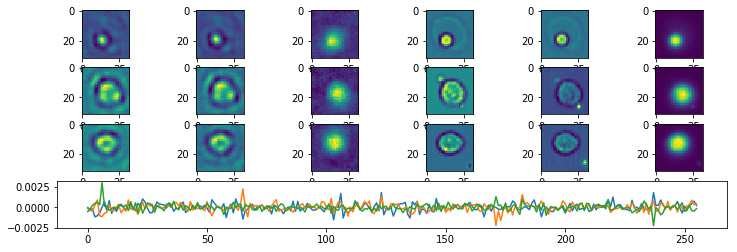

Epoch:  9 Iteration:  1000 Loss:  4.2253747 3.5170817 0.7082929


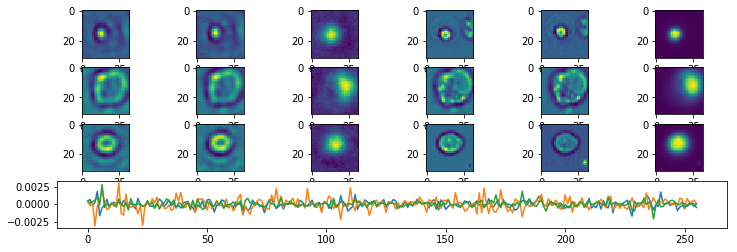

Epoch:  10 Iteration:  0 Loss:  6.035809 4.3999963 1.6358128


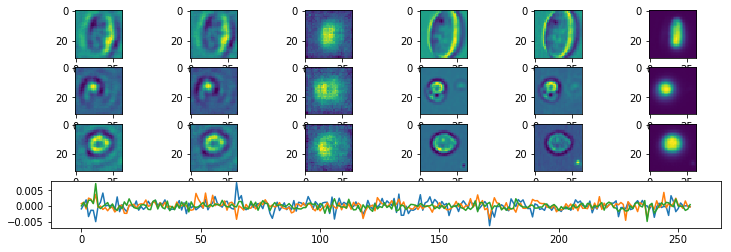

Epoch:  10 Iteration:  500 Loss:  4.4495883 3.5537357 0.8958527


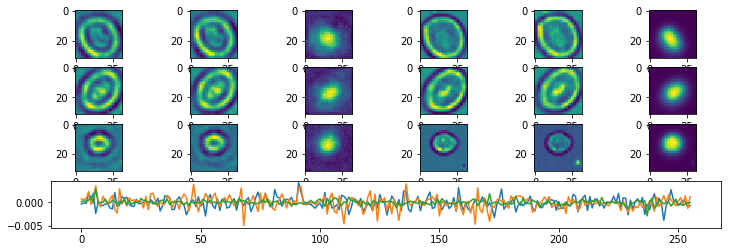

Epoch:  10 Iteration:  1000 Loss:  4.1231256 3.3559203 0.76720524


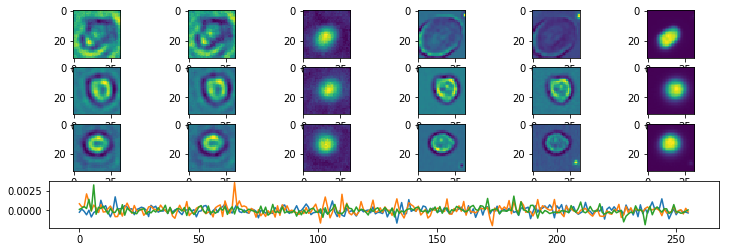

Epoch:  11 Iteration:  0 Loss:  3.9568474 3.231866 0.7249816


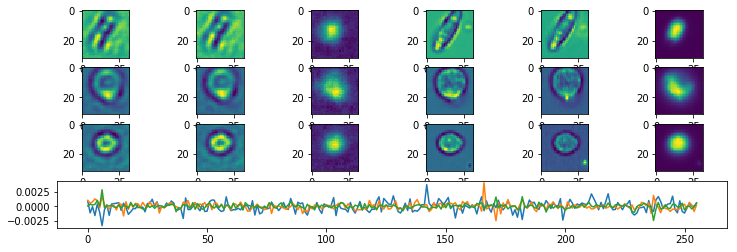

Epoch:  11 Iteration:  500 Loss:  4.1090307 3.3902416 0.71878904


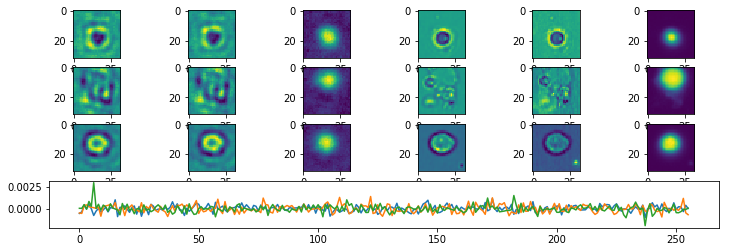

Epoch:  11 Iteration:  1000 Loss:  3.8990817 3.2235432 0.6755385


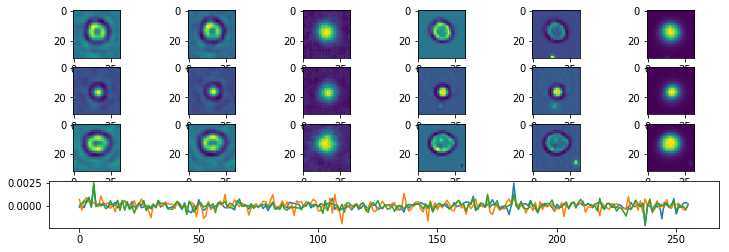

Epoch:  12 Iteration:  0 Loss:  3.787095 3.131455 0.65564


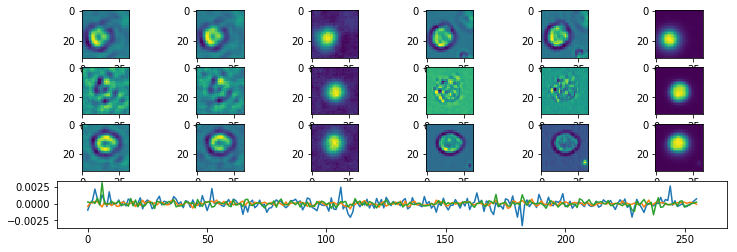

Epoch:  12 Iteration:  500 Loss:  3.8443377 3.1803675 0.6639703


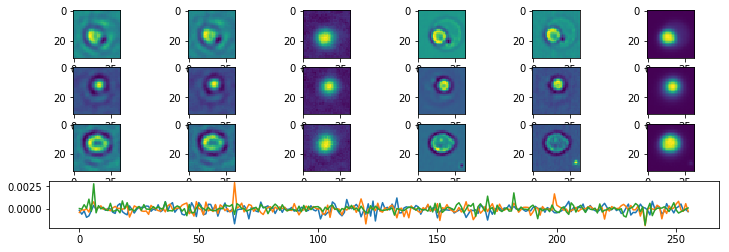

Epoch:  12 Iteration:  1000 Loss:  6.0196633 4.229231 1.7904323


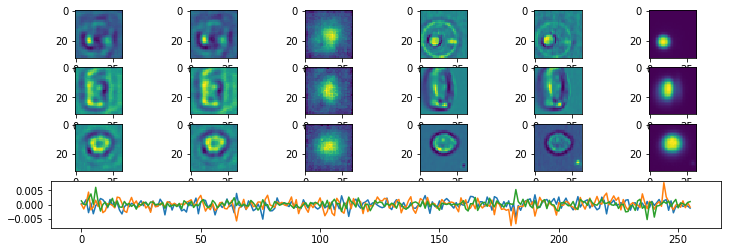

Epoch:  13 Iteration:  0 Loss:  4.109752 3.1933951 0.91635686


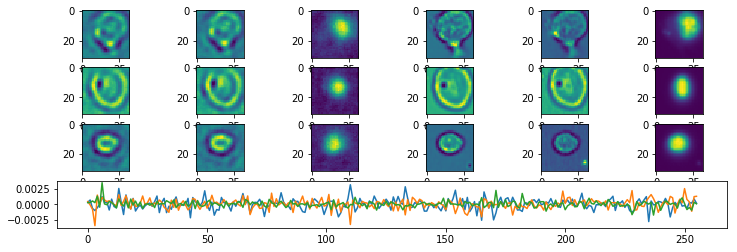

Epoch:  13 Iteration:  500 Loss:  3.98909 3.2189493 0.77014065


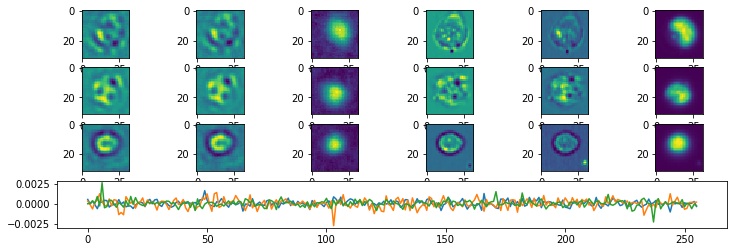

Epoch:  13 Iteration:  1000 Loss:  3.752283 3.0423346 0.7099484


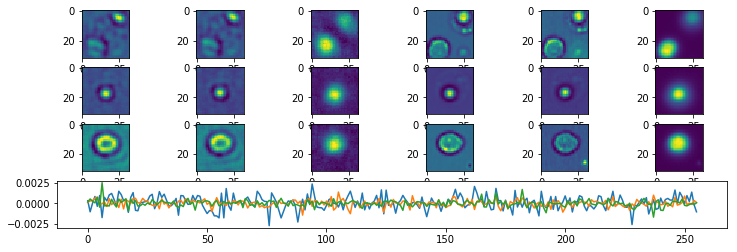

Epoch:  14 Iteration:  0 Loss:  3.6244347 2.934117 0.69031763


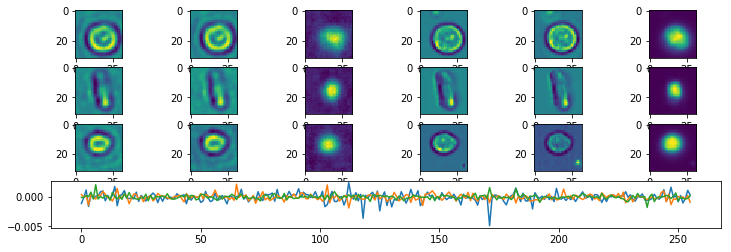

Epoch:  14 Iteration:  500 Loss:  3.7647183 3.0810392 0.68367904


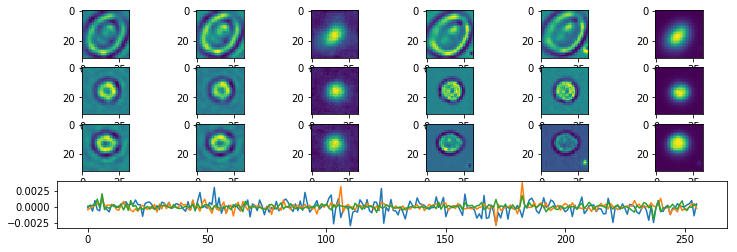

Epoch:  14 Iteration:  1000 Loss:  3.5491352 2.9033988 0.6457364


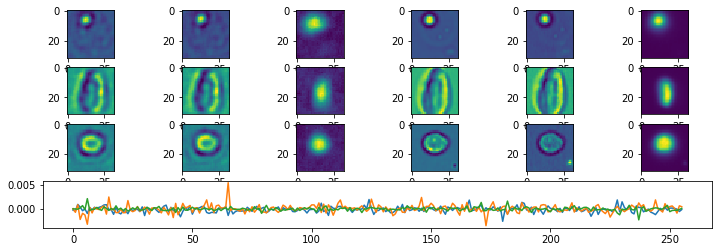

Epoch:  15 Iteration:  0 Loss:  3.4889781 2.8559594 0.6330187


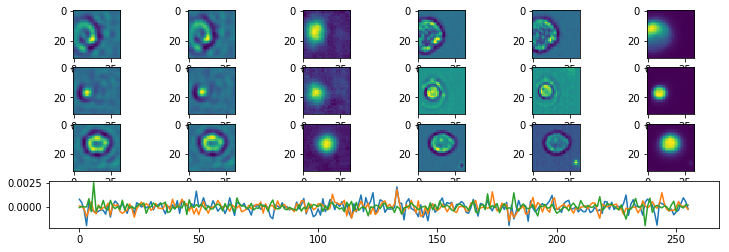

Epoch:  15 Iteration:  500 Loss:  3.6462252 3.0149612 0.63126403


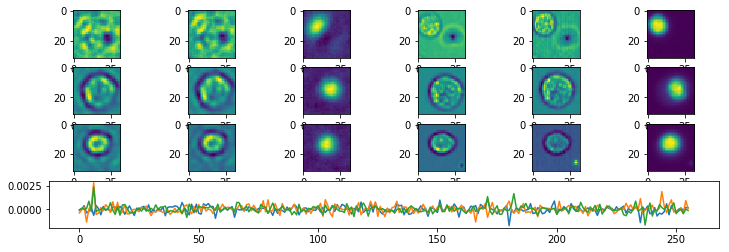

Epoch:  15 Iteration:  1000 Loss:  3.4851367 2.8712294 0.61390734


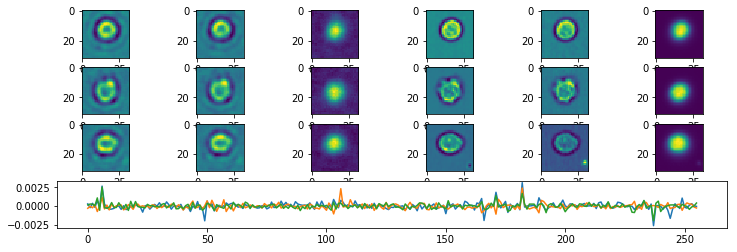

Epoch:  16 Iteration:  0 Loss:  3.3059697 2.7122579 0.59371173


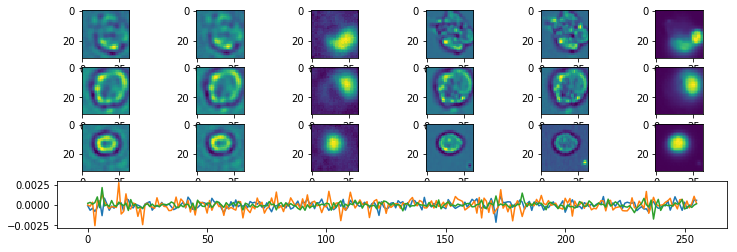

Epoch:  16 Iteration:  500 Loss:  6.244046 3.9597907 2.2842555


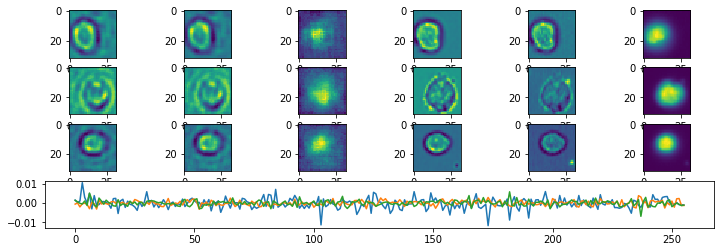

Epoch:  16 Iteration:  1000 Loss:  3.6969898 2.852676 0.8443139


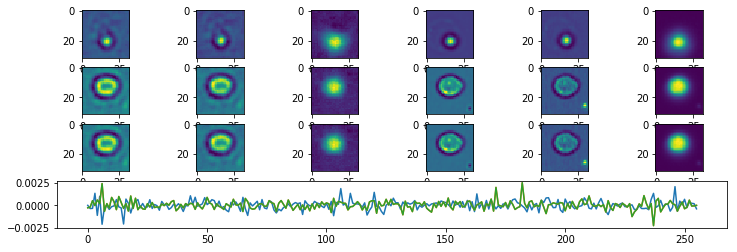

Epoch:  17 Iteration:  0 Loss:  3.40237 2.6685066 0.7338633


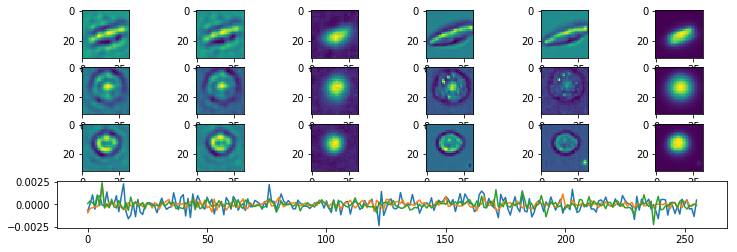

Epoch:  17 Iteration:  500 Loss:  3.487868 2.7927241 0.695144


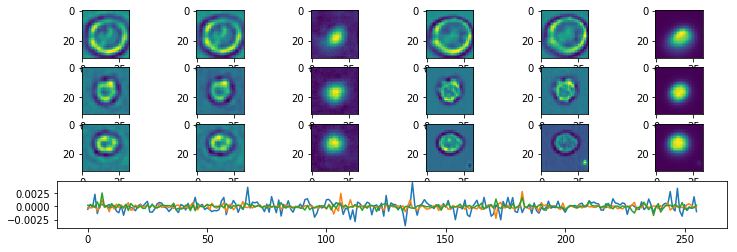

Epoch:  17 Iteration:  1000 Loss:  3.3697946 2.723638 0.6461565


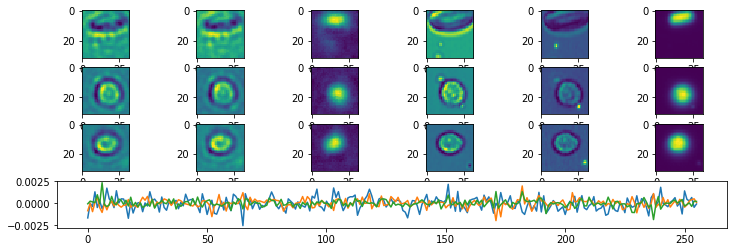

Epoch:  18 Iteration:  0 Loss:  3.1769376 2.5582726 0.61866504


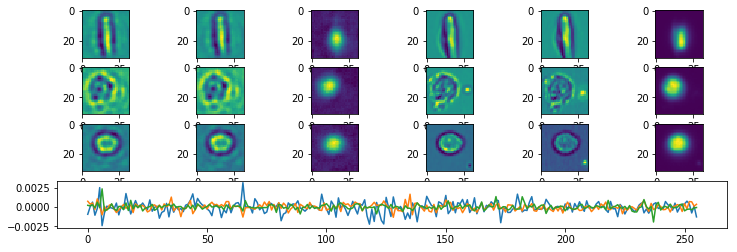

Epoch:  18 Iteration:  500 Loss:  3.3262093 2.7185898 0.60761946


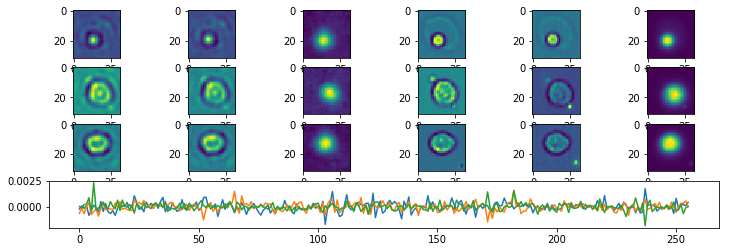

Epoch:  18 Iteration:  1000 Loss:  3.177793 2.6043859 0.5734073


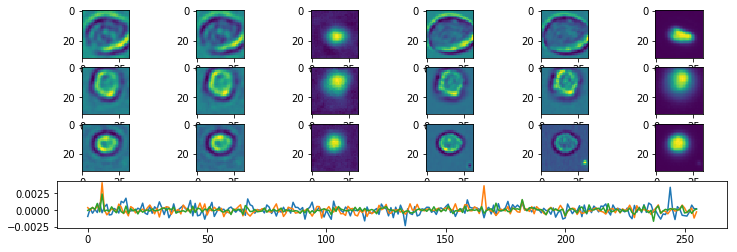

Epoch:  19 Iteration:  0 Loss:  3.0732503 2.5091186 0.5641317


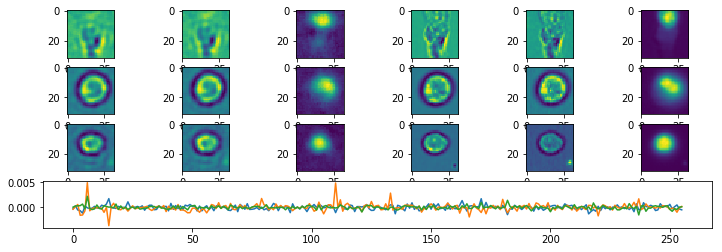

Epoch:  19 Iteration:  500 Loss:  3.216013 2.6152291 0.6007838


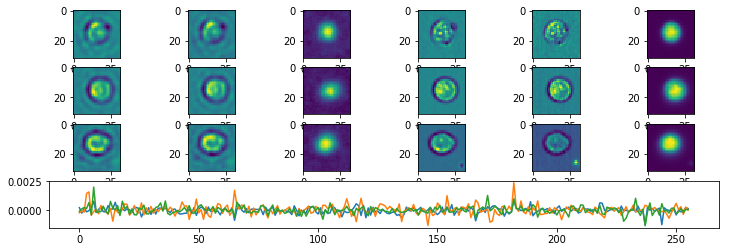

Epoch:  19 Iteration:  1000 Loss:  4.133725 2.8998134 1.2339119


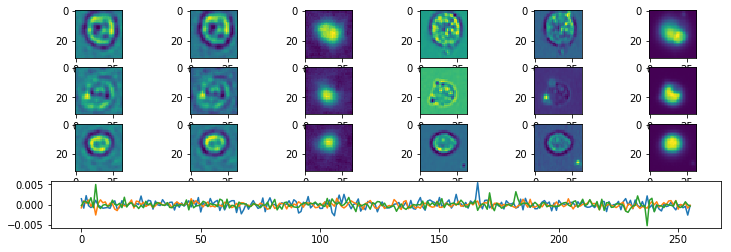

Epoch:  20 Iteration:  0 Loss:  3.1179214 2.4559085 0.66201276


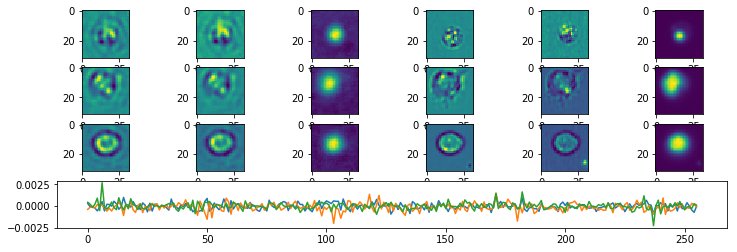

Epoch:  20 Iteration:  500 Loss:  3.1327066 2.5293689 0.6033377


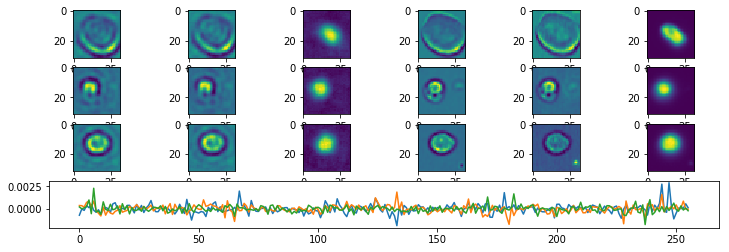

Epoch:  20 Iteration:  1000 Loss:  3.0195813 2.4595013 0.56007993


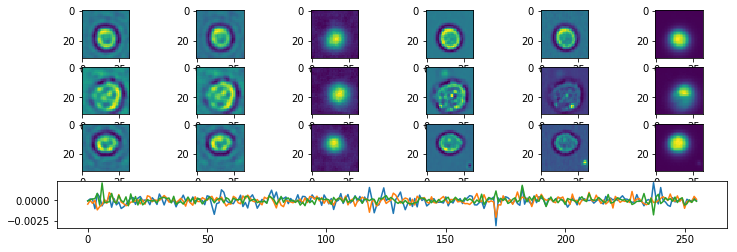

Epoch:  21 Iteration:  0 Loss:  2.8879209 2.3369138 0.551007


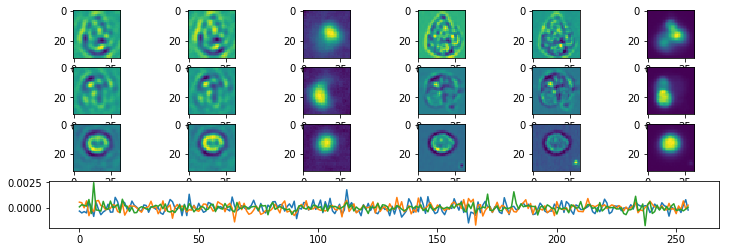

Epoch:  21 Iteration:  500 Loss:  3.091491 2.5603015 0.53118944


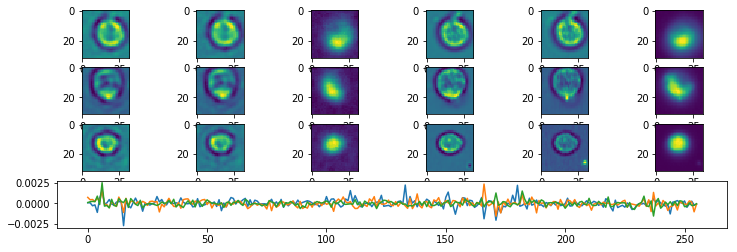

Epoch:  21 Iteration:  1000 Loss:  4.10561 2.792459 1.313151


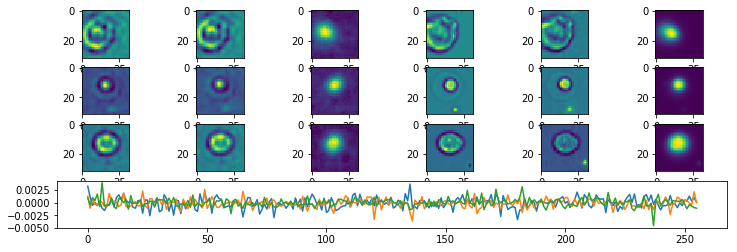

Epoch:  22 Iteration:  0 Loss:  3.3231184 2.4620311 0.8610873


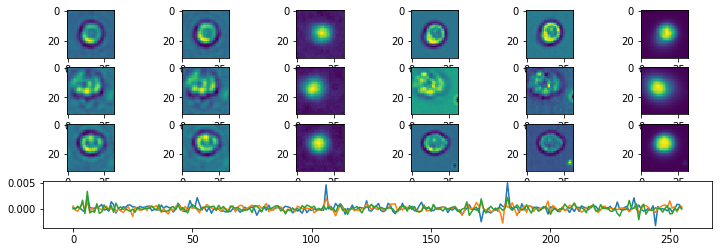

Epoch:  22 Iteration:  500 Loss:  3.1842132 2.4948506 0.68936247


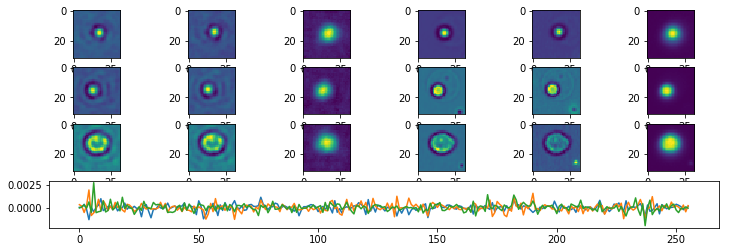

Epoch:  22 Iteration:  1000 Loss:  2.9779637 2.369046 0.6089178


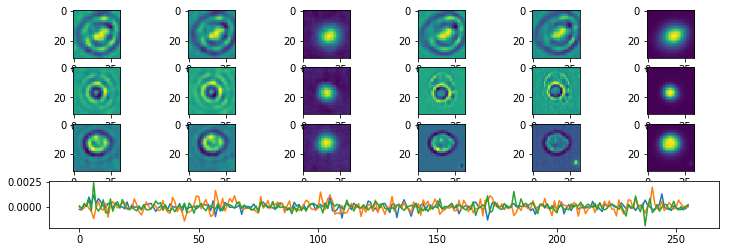

Epoch:  23 Iteration:  0 Loss:  2.8884683 2.311905 0.57656336


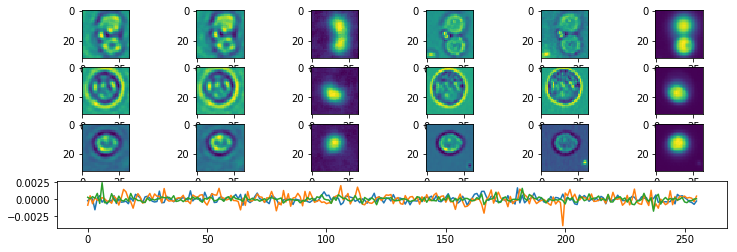

Epoch:  23 Iteration:  500 Loss:  3.0729156 2.4963174 0.5765981


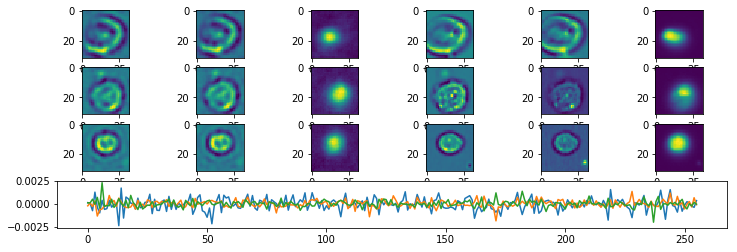

Epoch:  23 Iteration:  1000 Loss:  2.8303828 2.3017778 0.52860504


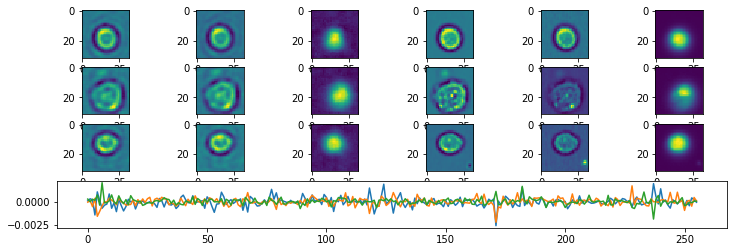

Epoch:  24 Iteration:  0 Loss:  2.7621465 2.2396915 0.522455


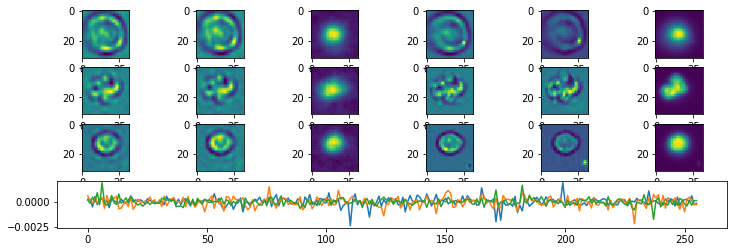

Epoch:  24 Iteration:  500 Loss:  3.2760246 2.4503555 0.8256691


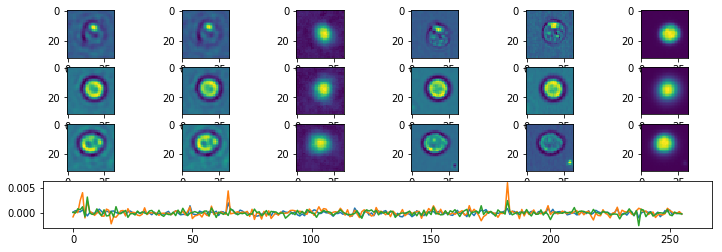

Epoch:  24 Iteration:  1000 Loss:  2.9037352 2.2809463 0.622789


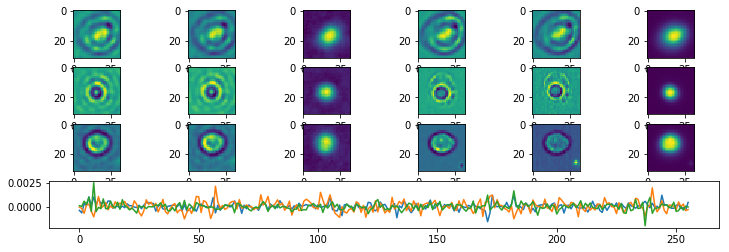

Epoch:  25 Iteration:  0 Loss:  2.7999947 2.222775 0.57721967


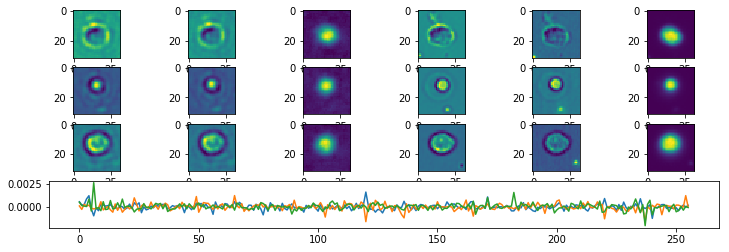

Epoch:  25 Iteration:  500 Loss:  2.8636427 2.2925768 0.57106584


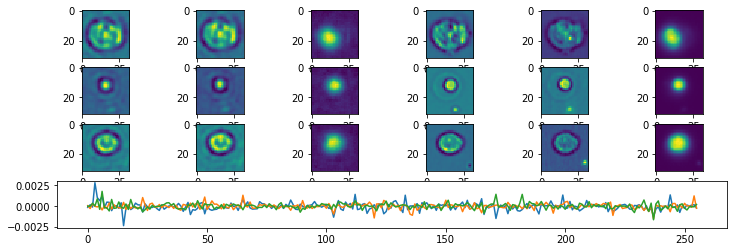

Epoch:  25 Iteration:  1000 Loss:  2.7535906 2.2152214 0.5383692


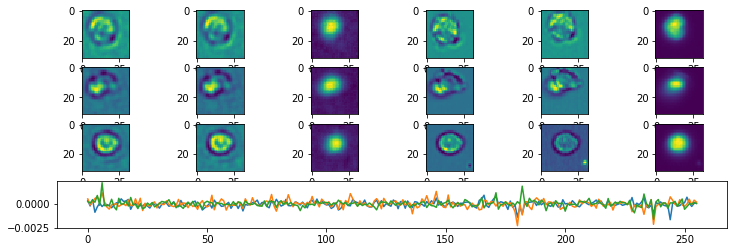

Epoch:  26 Iteration:  0 Loss:  2.6443038 2.1258137 0.51848996


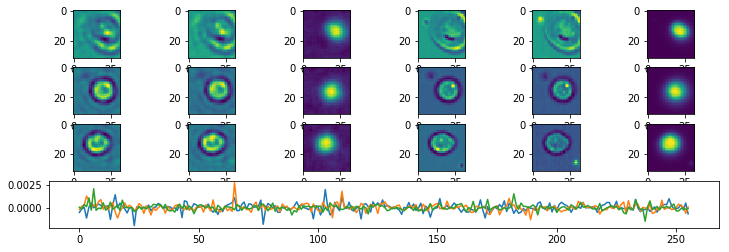

Epoch:  26 Iteration:  500 Loss:  2.7912936 2.2731042 0.5181895


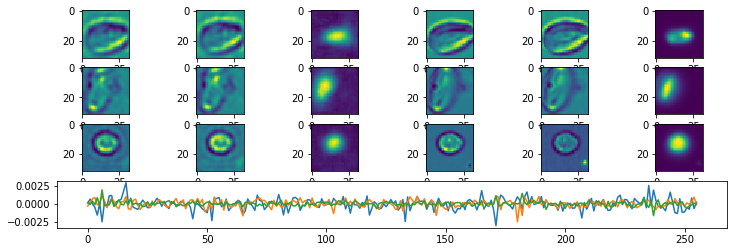

Epoch:  26 Iteration:  1000 Loss:  3.7047503 2.6689863 1.035764


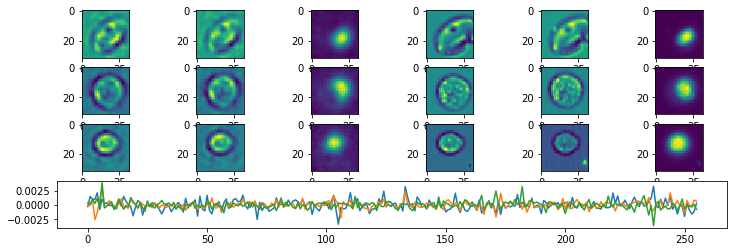

Epoch:  27 Iteration:  0 Loss:  3.1142943 2.3559613 0.7583329


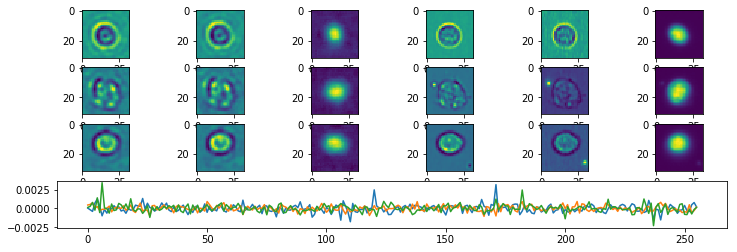

Epoch:  27 Iteration:  500 Loss:  3.0306666 2.366232 0.66443473


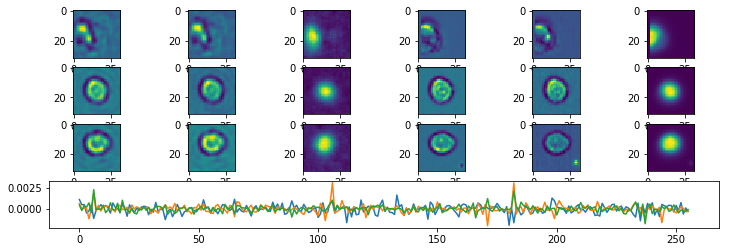

Epoch:  27 Iteration:  1000 Loss:  2.7915738 2.1992497 0.5923241


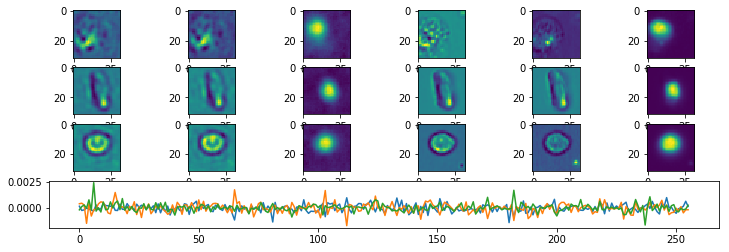

Epoch:  28 Iteration:  0 Loss:  2.6519222 2.0838945 0.5680278


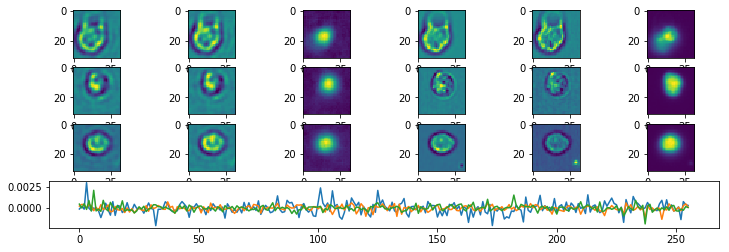

Epoch:  28 Iteration:  500 Loss:  2.7761014 2.2203133 0.55578804


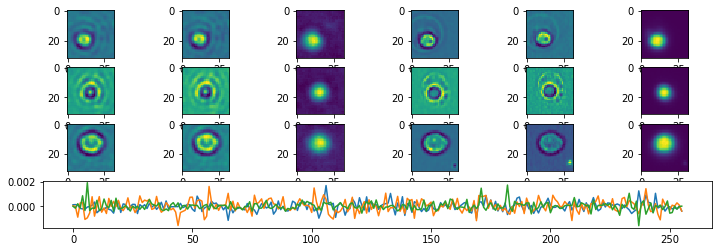

Epoch:  28 Iteration:  1000 Loss:  2.7376099 2.2008486 0.53676134


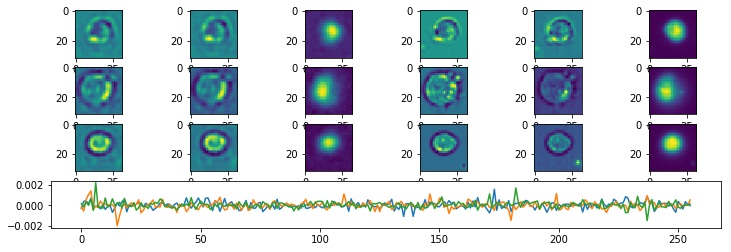

Epoch:  29 Iteration:  0 Loss:  2.5849762 2.0724978 0.5124783


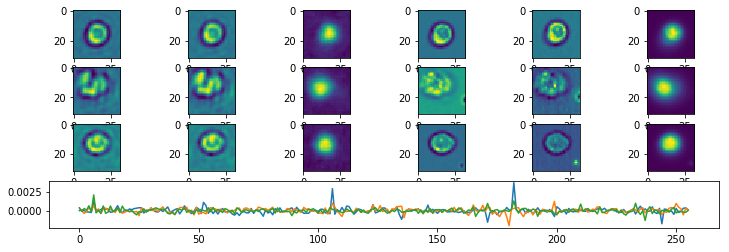

Epoch:  29 Iteration:  500 Loss:  2.6778595 2.1669784 0.51088125


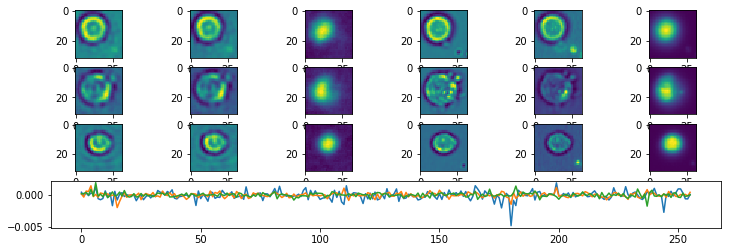

Epoch:  29 Iteration:  1000 Loss:  5.85891 3.6041706 2.2547395


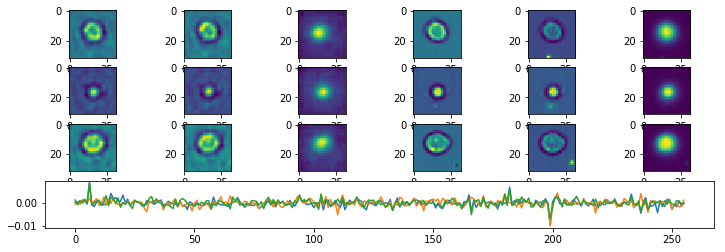

Epoch:  30 Iteration:  0 Loss:  2.8967812 2.171316 0.72546536


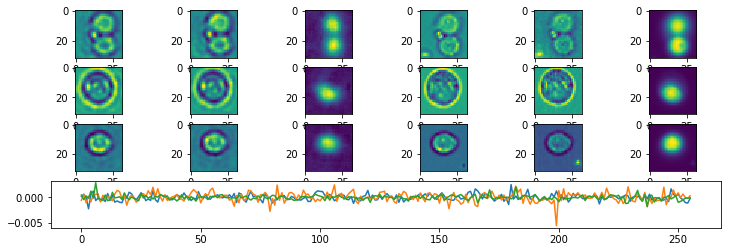

Epoch:  30 Iteration:  500 Loss:  2.8916426 2.2625394 0.6291032


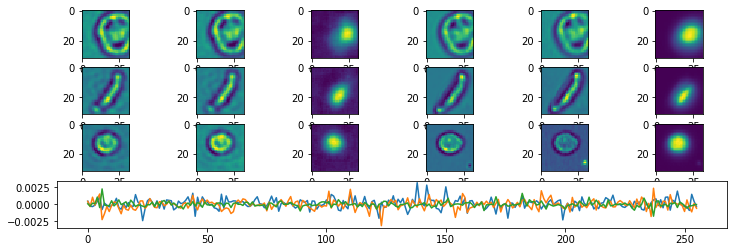

Epoch:  30 Iteration:  1000 Loss:  2.6860604 2.1321535 0.5539068


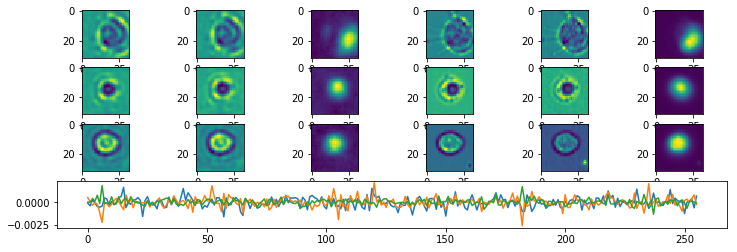

Epoch:  31 Iteration:  0 Loss:  2.574994 2.057568 0.51742595


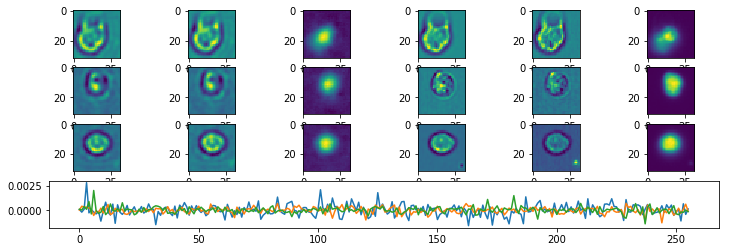

Epoch:  31 Iteration:  500 Loss:  2.7267153 2.1933625 0.5333529


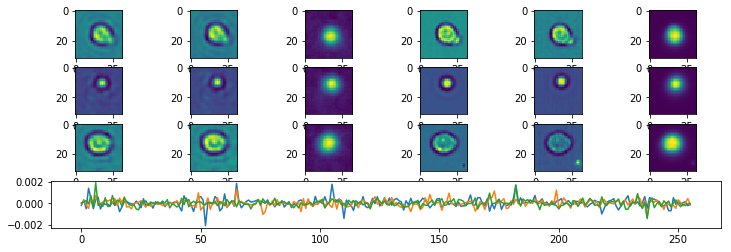

Epoch:  31 Iteration:  1000 Loss:  2.5498695 2.045486 0.5043835


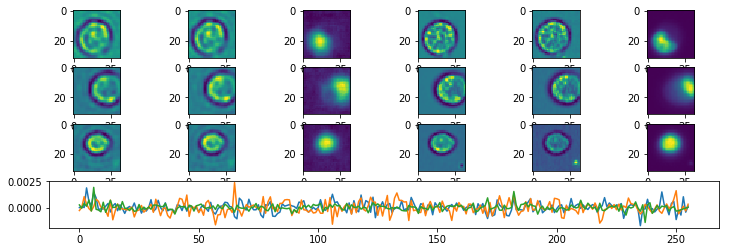

Epoch:  32 Iteration:  0 Loss:  2.476713 1.9821146 0.4945984


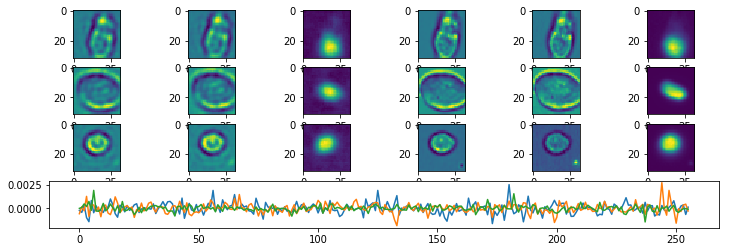

Epoch:  32 Iteration:  500 Loss:  2.596016 2.107091 0.48892498


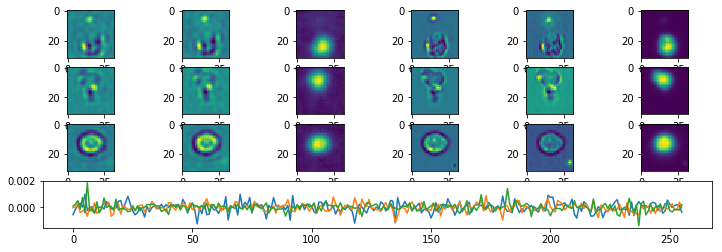

Epoch:  32 Iteration:  1000 Loss:  2.512879 1.9977307 0.5151483


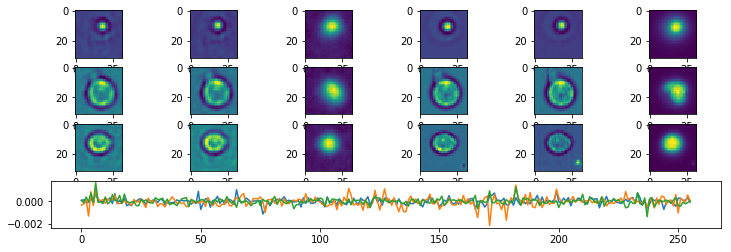

Epoch:  33 Iteration:  0 Loss:  2.460925 1.9575752 0.5033498


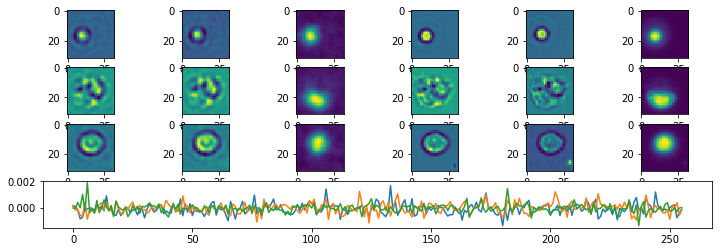

Epoch:  33 Iteration:  500 Loss:  2.7019892 2.1856828 0.51630634


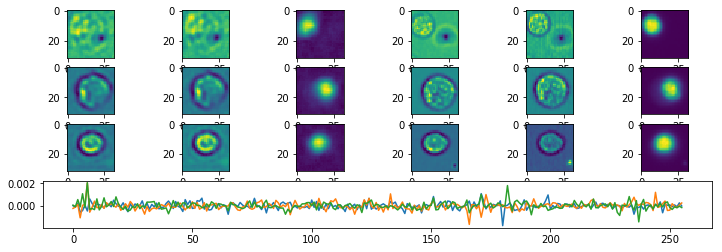

Epoch:  33 Iteration:  1000 Loss:  2.4181669 1.946272 0.47189483


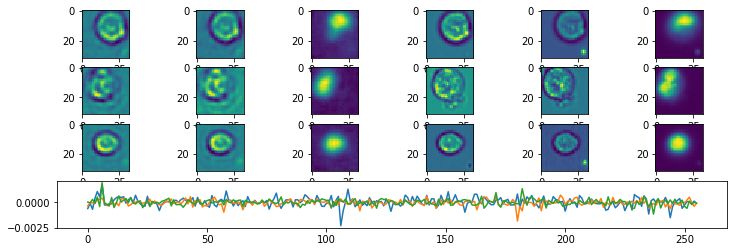

Epoch:  34 Iteration:  0 Loss:  2.953631 2.1666064 0.7870245


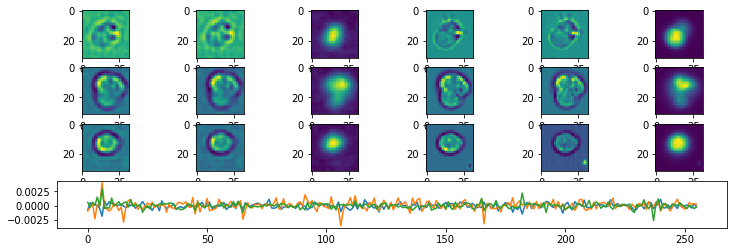

Epoch:  34 Iteration:  500 Loss:  2.7200384 2.11934 0.6006984


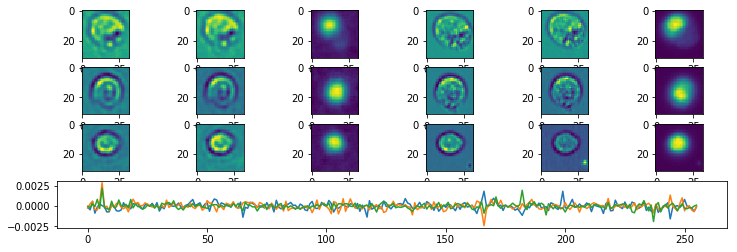

Epoch:  34 Iteration:  1000 Loss:  2.520321 1.9837039 0.5366169


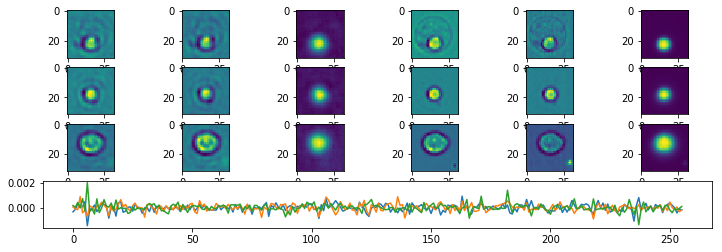

Epoch:  35 Iteration:  0 Loss:  2.3987205 1.89527 0.5034506


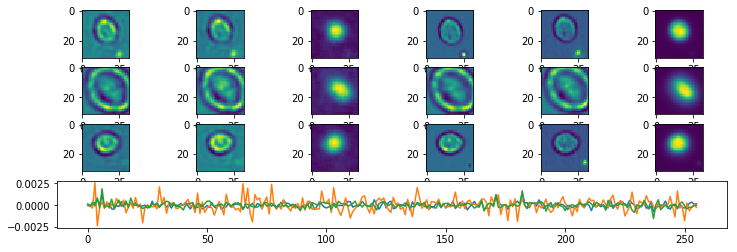

Epoch:  35 Iteration:  500 Loss:  2.5240724 2.019302 0.50477046


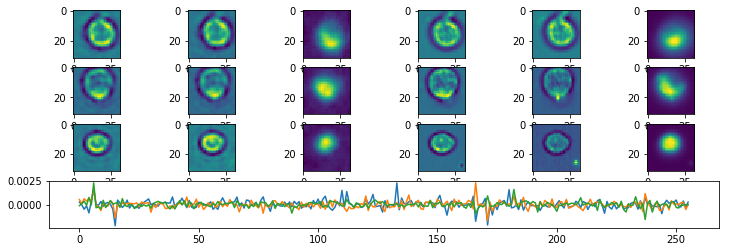

Epoch:  35 Iteration:  1000 Loss:  2.4189124 1.9355783 0.48333406


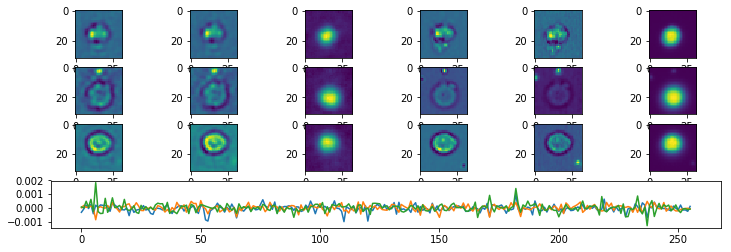

Epoch:  36 Iteration:  0 Loss:  2.3036768 1.837804 0.46587297


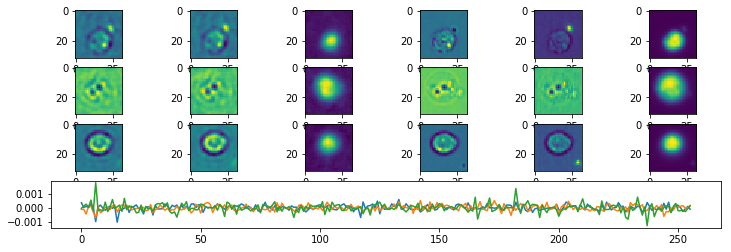

Epoch:  36 Iteration:  500 Loss:  2.5213296 2.045967 0.47536245


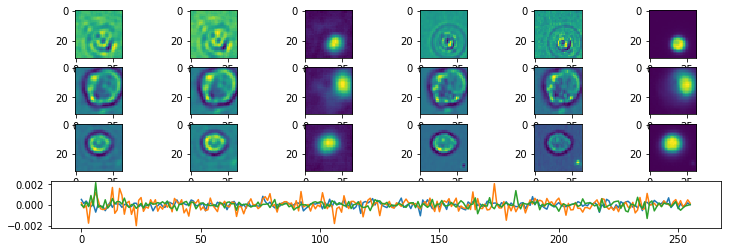

Epoch:  36 Iteration:  1000 Loss:  2.346377 1.8902147 0.45616218


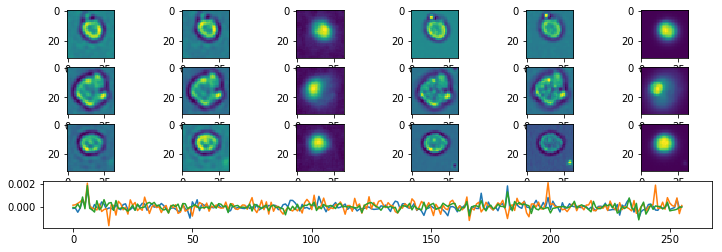

Epoch:  37 Iteration:  0 Loss:  5.979908 4.328197 1.6517109


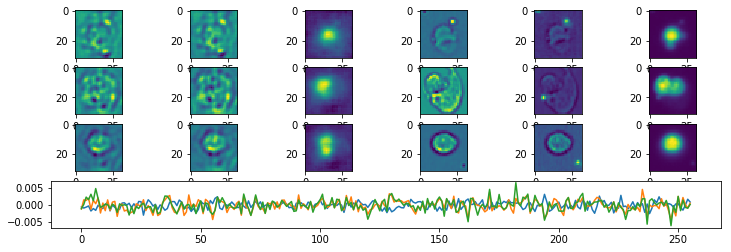

Epoch:  37 Iteration:  500 Loss:  2.4468179 1.9815888 0.46522912


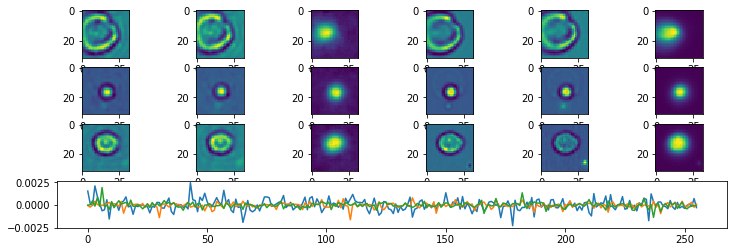

Epoch:  37 Iteration:  1000 Loss:  3.6040301 2.4524322 1.1515979


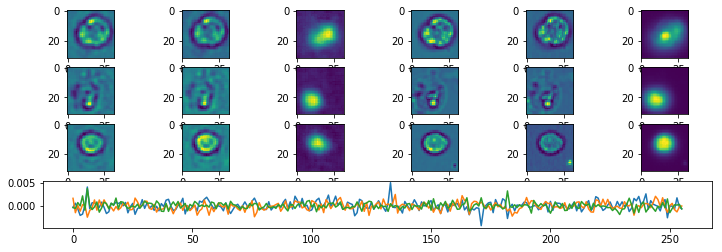

Epoch:  38 Iteration:  0 Loss:  2.7778127 1.9986315 0.7791812


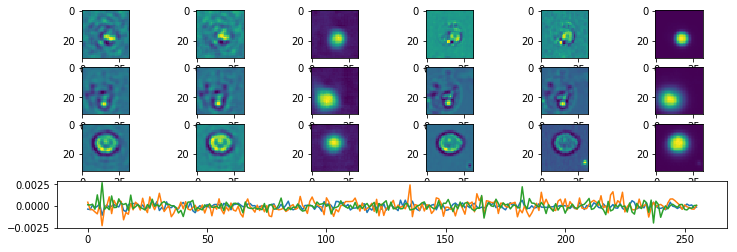

Epoch:  38 Iteration:  500 Loss:  2.5800178 1.9613154 0.61870235


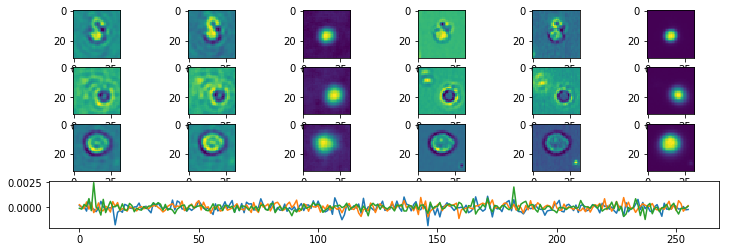

Epoch:  38 Iteration:  1000 Loss:  2.5193965 1.9551997 0.56419677


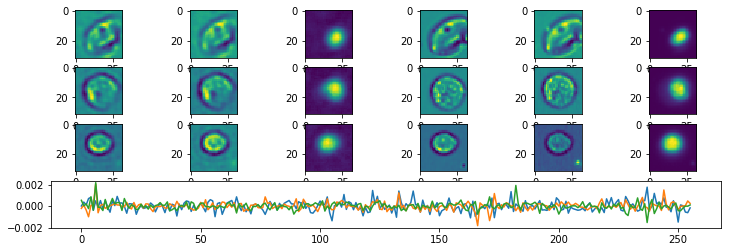

Epoch:  39 Iteration:  0 Loss:  2.3328018 1.8097882 0.52301353


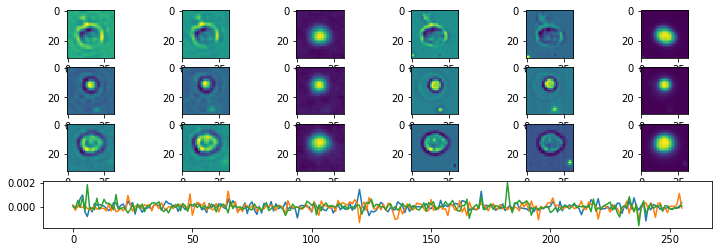

Epoch:  39 Iteration:  500 Loss:  2.4848075 1.9829992 0.50180817


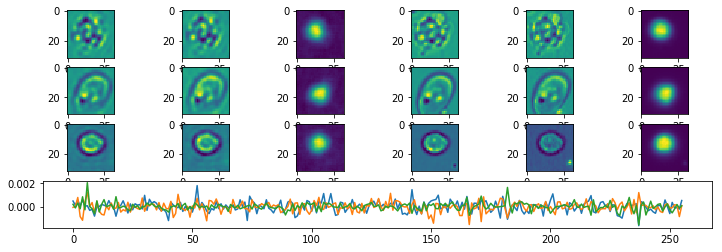

Epoch:  39 Iteration:  1000 Loss:  2.3025765 1.8089012 0.49367544


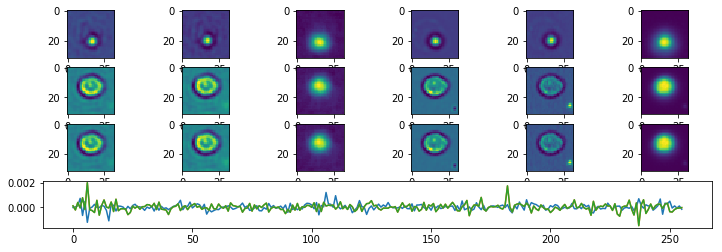

Done


In [5]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 3
p_channels = [0,3,4]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['denoise'] = None
params['slam'] = 0.05
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

#cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-06-07-256"
cpdir = "/v/Data/cyto/Checkpoints/2018-06-04-512"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [ ]:
x = 4
x